Autores: Bruno Leal Fonseca & Guilherme Namen Pimenta

## Business Understanding

**Objetivo do Dataset**
Os avanços nas tecnologias voltadas ao comércio eletrônico têm possibilitado um controle mais eficiente e preciso das relações comerciais. Os pilares tecnológicos de Big Data e Aprendizado de Máquina oferecem ferramentas poderosas para otimizar os processos de fornecimento de produtos e serviços. No contexto deste projeto, o foco está nos dados de agendamento de viagens coletados no site Expedia, com o objetivo de desenvolver um modelo capaz de classificar se o acesso foi realizado por meio de um dispositivo móvel ou não.

O objetivo principal deste projeto é desenvolver um modelo de classificação baseado em aprendizado de máquina capaz de identificar se o acesso à plataforma foi realizado por meio de um dispositivo móvel, como smartphones ou tablets. Para alcançar esse objetivo, serão analisados dados coletados durante interações de usuários na plataforma, buscando padrões e características que diferenciem acessos via dispositivos móveis daqueles realizados em desktops ou laptops.

**Origem dos Dados**
O Expedia é uma das maiores plataformas globais de viagens, especializada na oferta de serviços de planejamento e reserva para diversos tipos de viagens. Fundada em 1996, a plataforma é operada pela Expedia Group, uma empresa que reúne várias marcas no setor de turismo e hospitalidade, como Hotels.com, Vrbo, Orbitz, entre outras.

A plataforma também investe em tecnologias avançadas, como análise de dados e aprendizado de máquina, para oferecer recomendações personalizadas e melhorar a experiência do usuário. Além disso, o site e o aplicativo permitem acesso multiplataforma, incluindo dispositivos móveis, o que amplia a conveniência e a flexibilidade para os viajantes.

Os dados sobre as reservas e interações dos clientes com a plataforma digital foram disponibilizados publicamente no Kaggle: https://www.kaggle.com/datasets/jacopoferretti/expedia-travel-dataset?resource=download

Sendo possível fazer a obtenção da base de dados via a API do Kaggle.

**Características do Dataset**
- Linhas: Representam eventos individuais de busca ou reserva por usuários.
- Colunas: Contêm informações específicas sobre o evento, como:
    - `date_time`: Data e hora do evento.
    - `site_name`: Identificador do site onde o evento ocorreu.
    - `posa_continent`: Continente de origem do ponto de venda.
    - `user_location_country`, user_location_region, user_location_city: Localização do usuário.
    - `orig_destination_distance`: Distância entre o usuário e o destino.
    - `user_id`: Identificador único do usuário.
    - `is_mobile`: Indica se o acesso foi por dispositivo móvel (variável alvo).
    - `is_package`: Se o evento envolveu um pacote de viagem.
    - `srch_ci`, srch_co: Datas de check-in e check-out.
    - `srch_adults_cnt`, srch_children_cnt, srch_rm_cnt: Número de adultos, crianças e quartos na busca.
    - `srch_destination_id`, srch_destination_type_id: Identificadores do destino e seu tipo.
    - `is_booking`: Indica se o evento foi uma reserva.
    - `cnt`: Contagem do número de eventos.
    - `Informações` sobre o hotel:
    - `hotel_continent`, `hotel_country`, `hotel_market`, `hotel_cluster`

**Relação com o Problema de Negócio:**
Este dataset é relevante para o objetivo de classificar se o acesso foi realizado via dispositivo móvel, já que inclui informações ricas sobre o contexto do evento e o comportamento do usuário. Esse tipo de análise pode ser usado para:

- Personalizar a interface com base no dispositivo.
- Ajustar estratégias de marketing para usuários móveis.
- Melhorar a experiência do usuário para acessos via dispositivos móveis.

In [29]:
# Importando todas as bibliotecas e frameworks necessários para o projeto
import os
from dotenv import load_dotenv
import pandas as pd
from sklearn.svm import SVC
from sklearn.ensemble import AdaBoostClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder, MinMaxScaler, StandardScaler
from sklearn.model_selection import cross_validate
import umap
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt

In [30]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("jacopoferretti/expedia-travel-dataset")

print("Path to dataset files:", path)

Path to dataset files: C:\Users\bruno\.cache\kagglehub\datasets\jacopoferretti\expedia-travel-dataset\versions\1


In [31]:
load_dotenv("C:/GitHub/expedia-data-mining/expedia/config/.env")
target_var = os.environ["TARGET_VAR"]
data = pd.read_csv(f"{path}/travel.csv")
label = LabelEncoder().fit_transform(data[target_var].values)
data[target_var] = label
display(data)

,Unnamed: 0,date_time,site_name,posa_continent,user_location_country,user_location_region,user_location_city,orig_destination_distance,user_id,is_mobile,...,srch_children_cnt,srch_rm_cnt,srch_destination_id,srch_destination_type_id,is_booking,cnt,hotel_continent,hotel_country,hotel_market,hotel_cluster
0,24636210,2014-11-03 16:02:28,24,2,77,871,36643,456.1151,792280,0,...,0,1,8286,1,0,1,0,63,1258,68
1,19837144,2013-03-13 19:25:01,11,3,205,135,38749,232.4737,961995,0,...,0,1,1842,3,0,1,2,198,786,37
2,13066459,2014-10-13 13:20:25,2,3,66,314,48562,4468.2720,495669,0,...,0,1,8746,1,0,1,6,105,29,22
3,4691082,2013-11-05 10:40:34,11,3,205,411,52752,171.6021,106611,0,...,0,1,6210,3,1,1,2,198,1234,42
4,4878884,2014-06-10 13:34:56,2,3,66,174,50644,NaN,596177,0,...,1,1,12812,5,0,1,2,50,368,83
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,18926976,2013-03-31 16:45:01,2,3,66,351,21609,1386.4061,858268,0,...,0,1,762,6,0,1,2,50,503,91
99996,2700011,2013-09-29 14:09:07,2,3,66,462,49272,698.1395,957708,0,...,0,1,12843,5,0,1,2,50,661,6
99997,35620410,2014-07-11 22:05:54,37,1,69,998,52849,NaN,814512,1,...,0,3,18773,1,0,1,6,22,1794,38
99998,25735008,2013-07-02 01:03:12,2,3,66,246,28491,207.2549,881704,0,...,0,1,8859,1,0,1,2,50,212,89


## Data Understanding & Data Preparation

A próxima etapa é entender os dados e realizar algumas verificações, isso será necessário para garantir que as amostras que serão fornecidas no treinamento sejam condizentes com o que se espera encontrar em produção. Portanto, é mandatório fazer limpeza nos dados eliminando casos onde podem haver valores nulos ou que os atributos sejam conflitantes.

Além da limpeza de amostras que apresentam valores nulos em certos atributos que deveriam estar preenchidos, algumas lógicas também devem ser seguidas, pois o site registra todas as operações dos usuários, mas existem casos onde fica claro que nenhum plano de viagem sério está sendo feito. Isso inclusive indica que os registros de operações dos usuários é muito ruidoso. São propostas as seguintes regras para garantir a qualidade das amostras:

1. Linhas com valores nulos foram removidas.
2. Busca sem pessoas verificadas:
    - Garantido que a soma de `srch_children_cnt` e `srch_adults_cnt` seja maior que 0.
3. Busca sem adultos excluídas:
    - Removidas linhas com `srch_adults_cnt` igual a 0.
4. Conversões de data:
    - Colunas `date_time`, `srch_ci` e `srch_co` foram convertidas para o formato datetime.
5. Novas colunas criadas:
    - `travel_duration`: Duração da viagem em dias.
    - `days_in_advance`: Dias de antecedência da busca em relação à data do check-in.
6. Inconsistências removidas:
    - Apenas registros com `travel_duration > 0` foram mantidos.

Alguns atributos que podem ser interessantes serão gerados a partir de outros atributos, o que pode facilitar o aprendizado da rede. No caso do atributo `travel_duration`, permite um uso eficiente de atributos de data-hora. Como não é desejado usar esses tipos de atributo, para que o algoritmo de aprendizado não aprenda algo indevido, dependendo das datas para retornar um bom resultado, eles serão retirados e colocados outros atributos mais relevantes.

Abaixo é possível entender as correlações entre os atributos com um heat-map. Isso pode ajudar a entender se existe alguma correlação clara entre algum atributo e o rótulo, caso haja, pode-se filtrar alguns atributos mais relevantes facilitando o processo de aprendizado e interpretação de resultados.

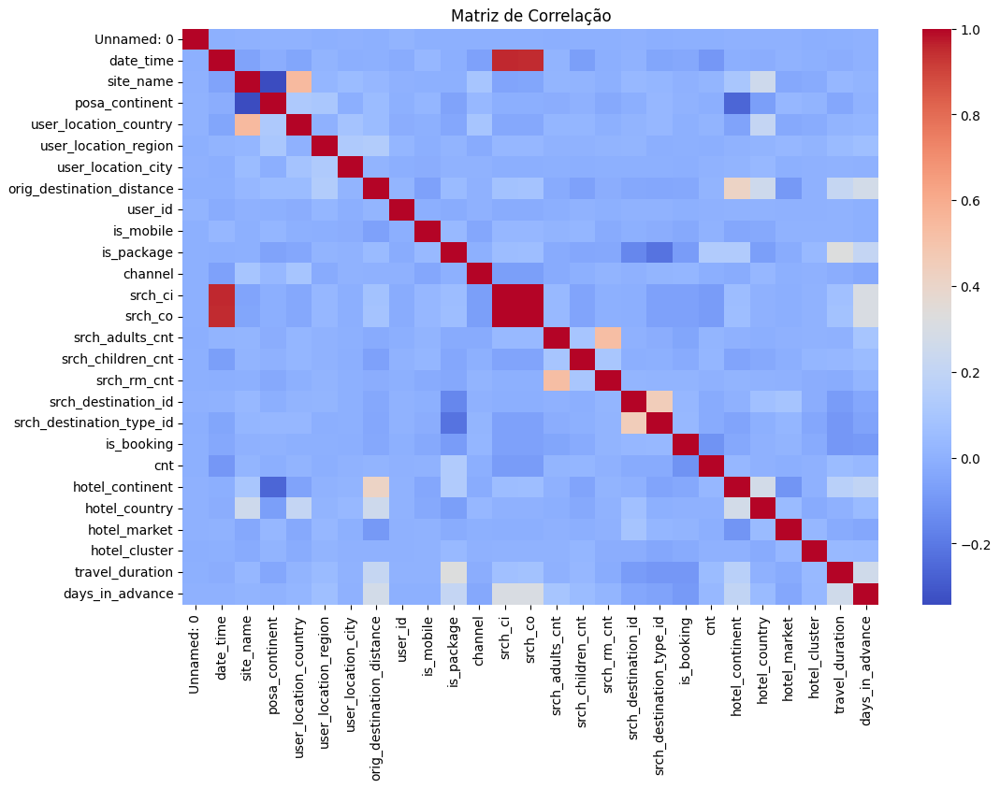

Também foi feito um gráfico de barra para visualizar o balanço das classes do atributo alvo da classificação.

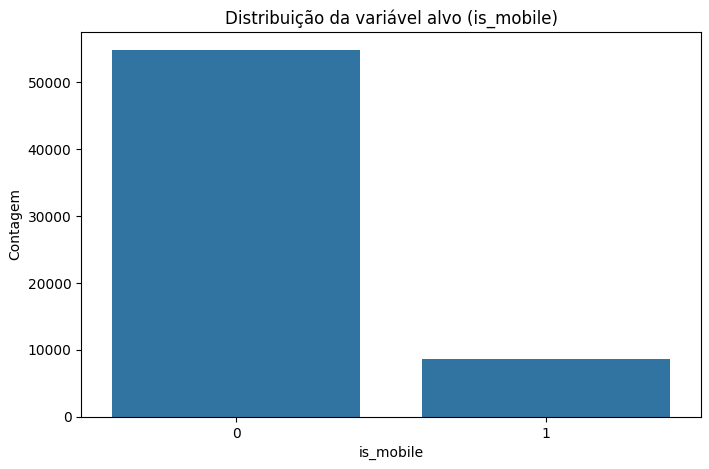

Ficou evidente um claro desbalanceamento nas classes do atributo alvo. Isso pode comprometer gravemente a classificação, com a abundância de uma classe, as funções de perda e objetivo que os otimizadores usam para o treinamento vão achar que o modelo está melhorando ou performando muito bem. Mas, na verdade, ele estará aprendendo a retornar apenas a classe mais abundante para todas as amostras de treinamento. Como a outra classes apresenta poucas amostras, a perda ou ganho var ser pouco impactado por causa delas e o algoritmo não consegue "aprender" as informações nos dados que permitem distinguir uma classe da outra.

In [32]:
# Removendo linhas com valores nulos
data_cleaned = data.dropna()

# Conferindo se srch_children_cnt + srch_adults_cnt > 0
data_cleaned = data_cleaned[
    (data_cleaned['srch_children_cnt'] + data_cleaned['srch_adults_cnt']) > 0
]

# Conferindo se srch_adults_cnt > 0
data_cleaned = data_cleaned[data_cleaned['srch_adults_cnt'] > 0]

# Convertendo colunas para datetime
data_cleaned['date_time'] = pd.to_datetime(data_cleaned['date_time'], errors='coerce')
data_cleaned['srch_ci'] = pd.to_datetime(data_cleaned['srch_ci'], errors='coerce')
data_cleaned['srch_co'] = pd.to_datetime(data_cleaned['srch_co'], errors='coerce')

# Criando as colunas travel_duration e days_in_advance
data_cleaned['travel_duration'] = (data_cleaned['srch_co'] - data_cleaned['srch_ci']).dt.days
data_cleaned['days_in_advance'] = (data_cleaned['srch_ci'] - data_cleaned['date_time']).dt.days

# Removendo valores inconsistentes de travel_duration (duração da viagem deve ser positiva)
data_cleaned = data_cleaned[data_cleaned['travel_duration'] > 0]

# Exibindo informações finais do dataset limpo
data_cleaned.info(), data_cleaned.head()

<class 'pandas.core.frame.DataFrame'>
Index: 63485 entries, 0 to 99999
Data columns (total 27 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   Unnamed: 0                 63485 non-null  int64         
 1   date_time                  63485 non-null  datetime64[ns]
 2   site_name                  63485 non-null  int64         
 3   posa_continent             63485 non-null  int64         
 4   user_location_country      63485 non-null  int64         
 5   user_location_region       63485 non-null  int64         
 6   user_location_city         63485 non-null  int64         
 7   orig_destination_distance  63485 non-null  float64       
 8   user_id                    63485 non-null  int64         
 9   is_mobile                  63485 non-null  int64         
 10  is_package                 63485 non-null  int64         
 11  channel                    63485 non-null  int64         
 12  srch_ci  

(None,
    Unnamed: 0           date_time  site_name  posa_continent  \
 0    24636210 2014-11-03 16:02:28         24               2   
 1    19837144 2013-03-13 19:25:01         11               3   
 2    13066459 2014-10-13 13:20:25          2               3   
 3     4691082 2013-11-05 10:40:34         11               3   
 5    34825186 2014-12-16 14:34:39          2               3   
 
    user_location_country  user_location_region  user_location_city  \
 0                     77                   871               36643   
 1                    205                   135               38749   
 2                     66                   314               48562   
 3                    205                   411               52752   
 5                     66                   220               38273   
 
    orig_destination_distance  user_id  is_mobile  ...  srch_destination_id  \
 0                   456.1151   792280          0  ...                 8286   
 1             

## Fundamentos Matemáticos

O UMAP utiliza conceitos de:

1. **Geometria Diferencial**: Define uma métrica Riemanniana nos dados para modelar sua estrutura local.
2. **Teoria de Grafos**: Constrói um grafo baseado em vizinhos próximos para capturar relações locais.
3. **Topologia Algébrica**: Relaciona a estrutura de alta dimensão ao grafo resultante.

### Etapas do Algoritmo

1. **Construção do Grafo de Similaridade**:
   - Cada ponto no espaço original é considerado como um nó no grafo.
   - Define-se um conjunto de vizinhos próximos usando a métrica **k-nearest neighbors (k-NN)**.
   - Uma função de afinidade (ou probabilidade) é atribuída às arestas do grafo para medir a similaridade entre pontos.

2. **Redução de Dimensionalidade**:
   - O grafo de alta dimensão é aproximado em um espaço de menor dimensão.
   - A otimização é feita através da minimização de uma **função de perda** que compara a estrutura dos grafos nos dois espaços (original e reduzido).

---

## Principais Características

- **Preservação de Estruturas Locais**: UMAP prioriza manter vizinhanças próximas no espaço reduzido.
- **Flexibilidade**: Suporta dados de diferentes métricas de distância, como Euclidiana, Manhattan, entre outras.
- **Velocidade**: É mais rápido que algoritmos como o t-SNE para grandes conjuntos de dados.
- **Parâmetros Importantes**:
  - *n_neighbors*: Controla o tamanho da vizinhança local.
  - *min_dist*: Define a distância mínima entre os pontos no espaço reduzido.
  - *metric*: Métrica de distância usada.

---

In [33]:
unbalancer_df = data_cleaned.copy()
unbalancer_df.drop(columns=["Unnamed: 0", 'date_time', 'srch_ci', 'srch_co'], inplace=True)

reducer = umap.UMAP(metric="manhattan", random_state=42)
embeddings = reducer.fit_transform(
    X=unbalancer_df.drop(columns=target_var), y=unbalancer_df[target_var].to_numpy()
)

plot_data = pd.DataFrame(embeddings, columns=["Component1", "Component2"])
plot_data["Label"] = unbalancer_df[target_var].to_numpy()

fig = px.scatter(
    plot_data,
    x="Component1",
    y="Component2",
    color="Label",
    title="Representação Bidimencional",
)

fig.update_traces(marker=dict(size=6, opacity=1.0))
fig.update_layout(scene=dict(xaxis_title="Component1", yaxis_title="Component2"))
fig.show()

c:\GitHub\expedia-data-mining\.venv\Lib\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



Existem diversas opções de balanço das classes dos pontos presentes na base de dados. A que foi escolhida foi o sob-amostragem (undersampling), pois os pontos pertencentes à `classe 0` se localizam de forma abundante em um padrão bem estabelecido, ao obter algumas amostras para igualar à quantidade da `classe 1`, naturalmente as regiões onde esses pontos se localizam no espaço multidimensional ainda vai ficar bem caracterizado.

Isso é possível evidenciar no plot acima, nota-se que na representação do algoritmo UMAP, há uma padrão de alta densidade de pontos da `classe 0` que circunscreve os pontos da `classe 1`. Com tantos pontos dessa classe repetindo um padrão com um desvio pouco expressivo, será possível capturar o comportamento desses usuários mesmo com poucas amostras e estabelecer as respectivas técnicas dos algoritmos para distingui-los.

<class 'pandas.core.frame.DataFrame'>
Index: 17248 entries, 60038 to 99991
Data columns (total 23 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   site_name                  17248 non-null  int64  
 1   posa_continent             17248 non-null  int64  
 2   user_location_country      17248 non-null  int64  
 3   user_location_region       17248 non-null  int64  
 4   user_location_city         17248 non-null  int64  
 5   orig_destination_distance  17248 non-null  float64
 6   user_id                    17248 non-null  int64  
 7   is_mobile                  17248 non-null  int64  
 8   is_package                 17248 non-null  int64  
 9   channel                    17248 non-null  int64  
 10  srch_adults_cnt            17248 non-null  int64  
 11  srch_children_cnt          17248 non-null  int64  
 12  srch_rm_cnt                17248 non-null  int64  
 13  srch_destination_id        17248 non-null  int6

None

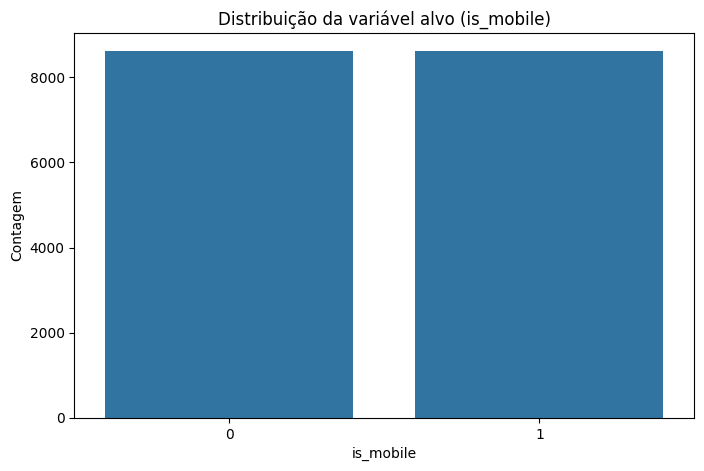

In [34]:
target_0 = data_cleaned[data_cleaned["is_mobile"] == 0]
target_1 = data_cleaned[data_cleaned["is_mobile"] == 1]

target_0_undersample = target_0.sample(n=len(target_1), random_state=42)
balanced_df = pd.concat([target_0_undersample, target_1])
balanced_df.drop(columns=["Unnamed: 0", 'date_time', 'srch_ci', 'srch_co'], inplace=True)
display(balanced_df.info())

plt.figure(figsize=(8, 5))
sns.countplot(x='is_mobile', data=balanced_df)
plt.title('Distribuição da variável alvo (is_mobile)')
plt.xlabel('is_mobile')
plt.ylabel('Contagem')
plt.show()

Pode-se validar o efeito do balanceamento de classes com outro plot de representação dos atributos com duas dimensões aplicando o UMAP:

In [35]:
reducer = umap.UMAP(metric="manhattan", random_state=42)
embeddings = reducer.fit_transform(
    X=balanced_df.drop(columns=target_var), y=balanced_df[target_var].to_numpy()
)

plot_data = pd.DataFrame(embeddings, columns=["Component1", "Component2"])
plot_data["Label"] = balanced_df[target_var].to_numpy()

fig = px.scatter(
    plot_data,
    x="Component1",
    y="Component2",
    color="Label",
    title="Representação Bidimencional",
)

fig.update_traces(marker=dict(size=6, opacity=1.0))
fig.update_layout(scene=dict(xaxis_title="Component1", yaxis_title="Component2"))
fig.show()

c:\GitHub\expedia-data-mining\.venv\Lib\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



O próximo passo é a normalização, para isso foram propostas duas técnicas:
    - Standard Scaling: Normaliza os dados com média zero de desvio-padrão um;
    - MimMax Scaling: Normaliza os dados, mapeando os ponto em um intervalo de zero a um, sendo o menor valor zero e o maior um.

Os dados foram normalizados em seguida foi feito outro plot com o UMAP para visualizar qual das duas técnicas promove uma melhor distinção entre as classes de pontos:

In [36]:
def min_max_normalize_data(p_dataset: pd.DataFrame) -> pd.DataFrame:
    scaler = MinMaxScaler()
    label = p_dataset[target_var].reset_index(drop=True)
    normalized_dataset = pd.DataFrame(
        scaler.fit_transform(p_dataset.drop(columns=[target_var])), columns=p_dataset.drop(columns=[target_var]).columns
    )
    normalized_dataset[target_var] = label

    return normalized_dataset

def standard_normalize_data(p_dataset: pd.DataFrame) -> pd.DataFrame:
    scaler = StandardScaler()
    label = p_dataset[target_var].reset_index(drop=True)
    normalized_dataset = pd.DataFrame(
        scaler.fit_transform(p_dataset.drop(columns=[target_var])), columns=p_dataset.drop(columns=[target_var]).columns
    )
    normalized_dataset[target_var] = label

    return normalized_dataset

In [37]:
norm_df = min_max_normalize_data(balanced_df)

reducer = umap.UMAP(metric="manhattan", random_state=42)
embeddings = reducer.fit_transform(
    X=norm_df.drop(columns=target_var), y=norm_df[target_var].to_numpy()
)

plot_data = pd.DataFrame(embeddings, columns=["Component1", "Component2"])
plot_data["Label"] = norm_df[target_var].to_numpy()

fig = px.scatter(
    plot_data,
    x="Component1",
    y="Component2",
    color="Label",
    title="Representação Bidimencional",
)

fig.update_traces(marker=dict(size=6, opacity=1.0))
fig.update_layout(scene=dict(xaxis_title="Component1", yaxis_title="Component2"))
fig.show()

c:\GitHub\expedia-data-mining\.venv\Lib\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



In [38]:
norm_df = standard_normalize_data(balanced_df)

reducer = umap.UMAP(metric="manhattan", random_state=42)
embeddings = reducer.fit_transform(
    X=norm_df.drop(columns=target_var), y=norm_df[target_var].to_numpy()
)

plot_data = pd.DataFrame(embeddings, columns=["Component1", "Component2"])
plot_data["Label"] = norm_df[target_var].to_numpy()

fig = px.scatter(
    plot_data,
    x="Component1",
    y="Component2",
    color="Label",
    title="Representação Bidimencional",
)

fig.update_traces(marker=dict(size=6, opacity=1.0))
fig.update_layout(scene=dict(xaxis_title="Component1", yaxis_title="Component2"))
fig.show()

c:\GitHub\expedia-data-mining\.venv\Lib\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



Ficou evidente que o Standard Scaling promoveu uma melhor diferenciação, de acordo com a representação bidimensional do UMAP. Isso na verdade é bem compreensível, pois alguns atributos numéricos como `["user_location_region", "orig_destination_distance", "srch_destination_id", "travel_duration"]` apresentam algumas faixas de valores com frequência bem mais expressiva que as demais, portanto, ao normalizar centralizando a média em zero e desvio-padrão um, o impacto de alguns outliers foi reduzido promovendo maior expressividade para valores mais frequentes.

Por fim, os dados serão preparados para a próxima etapa, onde será feita a modelagem.

In [39]:
norm_df = standard_normalize_data(balanced_df)

reducer = umap.UMAP(metric="manhattan", random_state=42)
embeddings = reducer.fit_transform(
    X=norm_df.drop(columns=target_var), y=norm_df[target_var].to_numpy()
)

embeddings_df = pd.DataFrame(embeddings, columns=["component1", "component2"])
embeddings_df[target_var] = norm_df[target_var].to_numpy()

X_data = embeddings_df.drop(columns=target_var)
y_data = embeddings_df[target_var]

display(X_data)
display(y_data)

c:\GitHub\expedia-data-mining\.venv\Lib\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



,component1,component2
0,9.734867,8.940793
1,2.482734,9.742342
2,6.893588,11.127956
3,8.651848,12.407971
4,9.219885,11.582021
...,...,...
17243,7.868988,-2.439505
17244,13.530773,-2.313131
17245,11.169648,-3.242651
17246,5.374699,-1.431637


0        0
1        0
2        0
3        0
4        0
        ..
17243    1
17244    1
17245    1
17246    1
17247    1
Name: is_mobile, Length: 17248, dtype: int64

## Modelling

Ao treinar um modelo de classificação de aprendizado de máquinas, deseja-se validar se a performance do que foi treinado usando certas métricas de qualidade que vão revelar o quão bem ele está performando. Para que isso seja feito, uma técnica comum é fazer uma separação da base de dados original em dois bancos, um que conterá os pontos multidimensionais que o modelo vai usar no treinamento, permitindo-o ajustar seus parâmetros ou estabelecer fronteiras no espaço dos atributos; e outro que conterá dados que o modelo não viu no treinamento, permitindo validar se ele de fato aprendeu algo util para fazer classificações corretas ou apenas sobreajustou ao dados de treinamento.

Essa separação em dois bancos pode ser feita por uma amostragem aleatória denominada `train_test_split`, contudo apenas validar em uma base de treino pode não ser o suficiente. Além de bons resultados nas métricas de qualidade, o modelo precisa ser robusto/consistente. Pelo fato da amostragem ser aleatória, não há garantia que ambas as bases de treino e teste contenham pontos que caracterizam bem o espaço original dos dados.

Das várias técnicas que podem ser empregadas, nesse trabalho será aplicado a `Validação Cruzada (Cross Validation - CV)`. CV consiste em dividir a base original D em k-partes igualmente distribuídas, denominadas `Dobras`, cada dobra `D_i` é tratada, de cada vez, como um conjunto de teste e as demais como conjunto de treino. Os `K` modelos construídos serão avaliados com uma das dobras por vez, retornando as métricas de qualidade.

Existe um compromisso que deve ser atendido ao avaliar e melhorar os modelos, chamado viés e variância.
- **Viés**: Está ligado a qualidade do classificador e sua capacidade de capturar as peculiaridades do modelo. Indicando de o classificado `M` é "correto ou incorreto"
- **Variância**: Ser um classificador completo nem é bom, ele pode ser eficiente em extrair informações contidas no treinamento, mas de ser também robusto. Um sobreajuste é um exemplo de ausência de robustez. Pequenas mudanças levam a uma alta variância nos resultados.

As métricas de qualidade que foram escolhidas para avaliar no processo de validação cruzada foram:
- **Acurácia**: Indica a fração de pontos classificados corretamente;
- **F1-Score**: As medidas-F fazem um balanço entre a precisão e a revocação, calculando a média harmônica de ambos. Se houver uma divergência seja pela precisão ou revocação, a métrica apresenta uma queda na qualidade.
- **ROC AUC**: A Receiver Operating Characteristics Analysis (ROC) é uma técnica para classificadores binários, a qual permite entender qual seria o melhor limiar para classificar um ponto para uma classe ou outra, gerando diversas matrizes de confusão no processo. A area under the curve (AUC) é obtida pelo ROC, é essencialmente, a probabilidade do classificador ranquear um caso de teste positivo aleatório mais alto que um caso de teste negativo aleatório. Ajudando a entender se o modelo está performando melhor ou não que um classificador aleatório.
- **Coeficiente de Jaccard**: É um coeficiente de similaridade, definido pelo tamanho da intercessão sobre o tamanho da união das classes dos rótulos binários. Ajuda a entender se os pontos estão pertencendo as suas respectivas classes ou desviando muito.

In [40]:
norm_df = standard_normalize_data(balanced_df)

reducer = umap.UMAP(metric="manhattan", random_state=42)
embeddings = reducer.fit_transform(
    X=norm_df.drop(columns=target_var), y=norm_df[target_var].to_numpy()
)

embeddings_df = pd.DataFrame(embeddings, columns=["component1", "component2"])
embeddings_df[target_var] = norm_df[target_var].to_numpy()

X_data = embeddings_df.drop(columns=target_var)
y_data = embeddings_df[target_var]

display(X_data)
display(y_data)

c:\GitHub\expedia-data-mining\.venv\Lib\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



,component1,component2
0,9.734867,8.940793
1,2.482734,9.742342
2,6.893588,11.127956
3,8.651848,12.407971
4,9.219885,11.582021
...,...,...
17243,7.868988,-2.439505
17244,13.530773,-2.313131
17245,11.169648,-3.242651
17246,5.374699,-1.431637


0        0
1        0
2        0
3        0
4        0
        ..
17243    1
17244    1
17245    1
17246    1
17247    1
Name: is_mobile, Length: 17248, dtype: int64

In [41]:
# Configurando os modelos
models = {
    "MLP": MLPClassifier((10, 10, 10), activation="relu", solver="adam", learning_rate="adaptive"),
    "SVM": SVC(C=10.0, kernel="rbf", random_state=42, verbose=True),
    "Logistic Regression": LogisticRegression(C=1.0, random_state=42),
    "Random Forest": RandomForestClassifier(random_state=42),
    "Adaboost": AdaBoostClassifier(learning_rate=0.01, random_state=42),
}
metrics_dict = {"Accuracy": "accuracy", "F1-Score": "f1", "ROC_AUC": "roc_auc", "Jaccard": "jaccard"}

# Função para treinar e avaliar os modelos
results = {}
for model_name, model in models.items():
    # Cross-validation
    cross_val = cross_validate(model, X_data, y_data, cv=5, scoring=metrics_dict, verbose=True)
    
    # Armazenando os resultados
    results[model_name] = cross_val

display(results)


[LibSVM][LibSVM][LibSVM][LibSVM][LibSVM]

c:\GitHub\expedia-data-mining\.venv\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.

c:\GitHub\expedia-data-mining\.venv\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.

c:\GitHub\expedia-data-mining\.venv\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.

c:\GitHub\expedia-data-mining\.venv\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.

c:\GitHub\expedia-data-minin

{'MLP': {'fit_time': array([1.20317078, 2.15915036, 2.00318408, 0.86486197, 0.95041633]),
  'score_time': array([0.01000452, 0.02538228, 0.01300097, 0.00699544, 0.01100445]),
  'test_Accuracy': array([1.        , 1.        , 0.99971014, 1.        , 1.        ]),
  'test_F1-Score': array([1.        , 1.        , 0.99971023, 1.        , 1.        ]),
  'test_ROC_AUC': array([1.        , 1.        , 0.99997412, 1.        , 1.        ]),
  'test_Jaccard': array([1.        , 1.        , 0.99942063, 1.        , 1.        ])},
 'SVM': {'fit_time': array([0.01300335, 0.0129981 , 0.00900269, 0.01000118, 0.01152015]),
  'score_time': array([0.01500773, 0.01500678, 0.01400089, 0.0160048 , 0.01795459]),
  'test_Accuracy': array([1.        , 1.        , 0.99971014, 1.        , 1.        ]),
  'test_F1-Score': array([1.        , 1.        , 0.99971023, 1.        , 1.        ]),
  'test_ROC_AUC': array([1.      , 1.      , 0.999672, 1.      , 1.      ]),
  'test_Jaccard': array([1.        , 1.       

## Evaluation

Pelo fato das fronteiras no espaço de atributos representado pelo UMAP permitia uma separação eficiente entre os pontos de diferentes classes, a performance dos modelos foi excelente. Os embeddings gerados pelo UMAP promoveram não apenas resultados elevados nas métricas de qualidade, mas também uma boa robustez. A média e variância dos resultados indicam que o modelo treinado conseguiu um viés e variância baixa, pois alcançou uma qualidade elevada e com boa repetibilidade, ou seja consegue retornar bons resultados com bases de treino e teste variadas.

Contudo, ao segregar os dados em um banco de treino e teste antes de obter os embeddings do UMAP, obtém-se resultados bem abaixo do esperado, chegando não ser melhor que uma classificador aleatório.

In [42]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(norm_df.drop(columns=[target_var]), norm_df[target_var], test_size=0.20)

display(X_train)
display(y_train)
display(X_test)
display(y_test)

,site_name,posa_continent,user_location_country,user_location_region,user_location_city,orig_destination_distance,user_id,is_package,channel,srch_adults_cnt,...,srch_destination_id,srch_destination_type_id,is_booking,cnt,hotel_continent,hotel_country,hotel_market,hotel_cluster,travel_duration,days_in_advance
13362,0.531232,0.165623,2.207461,-1.237413,-0.005802,-0.619865,1.374010,1.702308,-1.526008,-0.072569,...,1.125871,1.577152,-0.282289,-0.414796,-0.575414,2.389926,-0.476073,1.364212,-0.435359,1.553583
4722,-0.454298,0.165623,-0.393730,-0.805750,-1.532937,-0.838258,-0.785940,-0.587438,-0.740366,-0.072569,...,0.105187,-0.745842,-0.282289,-0.414796,-0.575414,-0.417325,1.039364,-0.215907,-0.435359,-0.766675
4523,3.049810,0.165623,2.207461,0.531700,1.017252,-0.711925,0.632212,-0.587438,-1.526008,-0.072569,...,1.109193,1.577152,-0.282289,-0.414796,-0.575414,2.389926,-0.508454,-1.109018,-0.766989,-0.114576
86,0.531232,0.165623,2.207461,0.312330,-0.147455,-0.730954,0.027007,-0.587438,0.830918,-0.072569,...,0.952667,-0.745842,-0.282289,-0.414796,-0.575414,-0.417325,-0.217024,-0.112856,-0.766989,-0.615024
16803,-0.454298,0.165623,-0.393730,-0.961432,0.276597,0.333686,-1.405577,-0.587438,-1.002246,-0.072569,...,-0.564896,-0.745842,-0.282289,-0.414796,-0.575414,-0.417325,0.119740,0.677204,-0.766989,0.128065
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2474,0.531232,0.165623,2.207461,-1.095884,-0.789861,2.583734,-0.462948,1.702308,-0.216604,-1.219845,...,0.196028,1.112554,-0.282289,-0.414796,0.123905,1.498434,1.661081,1.055058,0.227899,-0.493703
12909,-0.454298,0.165623,-0.393730,-0.961432,0.072592,-0.836803,-0.542947,-0.587438,0.830918,-0.072569,...,-0.140132,1.112554,-0.282289,1.324242,-0.575414,-0.417325,1.317841,-0.112856,-0.766989,-0.812170
5057,1.845273,-3.790980,-1.610114,-0.940202,0.657246,-0.391187,1.124476,-0.587438,0.830918,-0.072569,...,-0.197245,1.577152,-0.282289,-0.414796,2.221864,-0.037967,-1.296395,1.329861,1.886045,-0.736344
10415,-0.454298,0.165623,-0.393730,-0.961432,-0.319377,2.163919,-0.032780,-0.587438,-1.264127,-0.072569,...,-0.318833,-0.745842,-0.282289,-0.414796,0.823225,2.351990,2.923945,1.467263,1.554416,-0.053916


13362    1
4722     0
4523     0
86       0
16803    1
        ..
2474     0
12909    1
5057     0
10415    1
7225     0
Name: is_mobile, Length: 13798, dtype: int64

,site_name,posa_continent,user_location_country,user_location_region,user_location_city,orig_destination_distance,user_id,is_package,channel,srch_adults_cnt,...,srch_destination_id,srch_destination_type_id,is_booking,cnt,hotel_continent,hotel_country,hotel_market,hotel_cluster,travel_duration,days_in_advance
11886,3.049810,0.165623,2.207461,-1.095884,-0.835384,-0.397825,0.493079,-0.587438,0.830918,-0.072569,...,-0.566480,-0.745842,-0.282289,0.454723,-0.575414,-0.417325,0.018279,0.986357,0.227899,0.522357
17152,-0.454298,0.165623,-0.393730,0.326483,-0.335903,-0.790735,0.226818,-0.587438,0.830918,2.221981,...,-0.563592,-0.745842,-0.282289,-0.414796,-0.575414,-0.417325,0.093835,0.745905,-0.766989,-0.433043
2483,-0.454298,0.165623,-0.393730,-0.593456,1.052605,1.255198,-1.266545,-0.587438,0.830918,-0.072569,...,-0.509739,-0.745842,-0.282289,-0.414796,-0.575414,-0.417325,-0.879757,0.024546,-0.435359,0.203891
7000,-0.454298,0.165623,-0.393730,-0.367010,-0.962145,-0.150037,-0.748888,-0.587438,-0.740366,-0.072569,...,-0.197897,1.577152,-0.282289,-0.414796,-0.575414,-0.417325,0.018279,0.986357,-0.435359,-0.554363
10485,-0.454298,0.165623,-0.393730,-0.961432,1.130878,-0.640097,0.731104,-0.587438,0.830918,1.074706,...,-0.192587,1.577152,-0.282289,-0.414796,-0.575414,-0.417325,-0.542994,-1.383821,0.227899,-0.175236
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6917,-0.454298,0.165623,-0.393730,-1.110037,0.067446,-0.405150,-0.211479,1.702308,0.830918,-0.072569,...,-0.514305,-0.745842,-0.282289,-0.414796,0.823225,-1.213977,1.969781,0.780255,0.559528,-0.448208
14719,0.531232,0.165623,2.207461,0.234489,0.595863,0.717304,1.526602,-0.587438,0.830918,-1.219845,...,0.699336,1.577152,-0.282289,0.454723,2.221864,-0.493196,0.387424,0.264999,1.222786,0.522357
6454,-0.454298,0.165623,-0.393730,0.149571,1.646703,-0.607221,-1.165873,-0.587438,0.830918,-0.072569,...,-0.623780,0.183356,-0.282289,-0.414796,-0.575414,-0.417325,0.119740,1.639015,-0.435359,-0.706014
3329,-0.454298,0.165623,-0.393730,-0.635915,1.183847,1.571084,1.343382,-0.587438,0.830918,-0.072569,...,-0.520268,-0.745842,-0.282289,0.454723,2.221864,0.625910,-1.274807,0.368050,-0.766989,-0.311722


11886    1
17152    1
2483     0
7000     0
10485    1
        ..
6917     0
14719    1
6454     0
3329     0
36       0
Name: is_mobile, Length: 3450, dtype: int64

In [43]:
reducer = umap.UMAP(metric="manhattan", random_state=42)
reducer.fit(
    X=X_train, y=y_train
)

c:\GitHub\expedia-data-mining\.venv\Lib\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



UMAP(metric='manhattan', n_jobs=1, random_state=42, tqdm_kwds={'bar_format': '{desc}: {percentage:3.0f}%| {bar} {n_fmt}/{total_fmt} [{elapsed}]', 'desc': 'Epochs completed', 'disable': True})

In [44]:
embeddings = reducer.transform(X_train)

plot_data = pd.DataFrame(embeddings, columns=["Component1", "Component2"])
plot_data["Label"] = y_train.reset_index(drop=True)

fig = px.scatter(
    plot_data,
    x="Component1",
    y="Component2",
    color="Label",
    title="Representação Bidimencional",
)

fig.update_traces(marker=dict(size=6, opacity=1.0))
fig.update_layout(scene=dict(xaxis_title="Component1", yaxis_title="Component2"))
fig.show()

In [45]:
embeddings = reducer.transform(X_test)

plot_data = pd.DataFrame(embeddings, columns=["Component1", "Component2"])
plot_data["Label"] = y_test.reset_index(drop=True)

fig = px.scatter(
    plot_data,
    x="Component1",
    y="Component2",
    color="Label",
    title="Representação Bidimencional",
)

fig.update_traces(marker=dict(size=6, opacity=1.0))
fig.update_layout(scene=dict(xaxis_title="Component1", yaxis_title="Component2"))
fig.show()

A conclusão é que a base é muito complexa para ser bem classificada embora o UMAP consiga separar bem as classes ele não foi capaz de generalizar para novos dados. O UMAP, ao invés de aprender a mapear os pontos de acordo com seus atributos de forma distinguir as classes dos rótulos, ele simplesmente sobreajustou aos dados de treino.